## Introduction to GeoPandas

### Part 2: Loops, Table Joins, and Plotting

In this exercise, we will join data based on values within each table. The name of the field to be joined does not have to be the same, but the data type has to be the same (numbers to numbers, strings to strings, etc.)

Import the libraries

```import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import glob
%matplotlib inline```

### Looping

Looping allows us to perform the same action(s) on multiple files. The ```glob``` module will find and list files based on search parameters

```data = glob.glob('*data/counties*.csv')```

Loop over the file list to get the filename and year


```for f in data:
    year = f[13:-4]
    print (f, year)```

In [234]:
data = glob.glob('*data/counties*.csv')

for f in data:
    year = f[13:-4]
    print (f, year)

data/counties1980.csv 1980
data/counties1990.csv 1990
data/counties2010.csv 2010
data/counties2000.csv 2000


### Joining

Joining files based on fields in a dataFrame

Let's join some csv files of county population data (1980-2010) to a county boundaries file

First, create a Pandas dataFrame ```counties1980``` using ```read_csv()```

```counties1980 = pd.read_csv('data/counties1980.csv')```

In [235]:
counties1980 = pd.read_csv('data/counties1980.csv')
counties1980

,GEO.id,GEO.id2,GEO.display-label,GCT_STUB.target-geo-id,GCT_STUB.target-geo-id2,GCT_STUB.display-label,GCT_STUB.display-label.1,HC01,HC02,HC04,HC05,HC06,HC08,HC09
0,Id,Id2,Geography,Target Geo Id,Target Geo Id2,Geographic area,County,Population,Housing units,Area in square miles - Total area,Area in square miles - Water area,Area in square miles - Land area,Density per square mile of land area - Population,Density per square mile of land area - Housing...
1,0400000US06,6,California,0400000US06,6,California,California,23667902,12214549,163695.57,7736.23,155959.34,217.2,78.3
2,0400000US06,6,California,0500000US06001,6001,California - Alameda County,Alameda County,1073184,540183,821.15,83.57,737.57,1957.4,732.4
3,0400000US06,6,California,0500000US06003,6003,California - Alpine County,Alpine County,484,1514,743.19,4.57,738.62,1.6,2
4,0400000US06,6,California,0500000US06005,6005,California - Amador County,Amador County,11821,15035,604.69,11.73,592.97,59.2,25.4
5,0400000US06,6,California,0500000US06007,6007,California - Butte County,Butte County,101969,85523,1677.11,37.62,1639.49,123.9,52.2
6,0400000US06,6,California,0500000US06009,6009,California - Calaveras County,Calaveras County,13585,22946,1036.84,16.81,1020.04,39.8,22.5
7,0400000US06,6,California,0500000US06011,6011,California - Colusa County,Colusa County,12430,6774,1156.22,5.54,1150.68,16.3,5.9
8,0400000US06,6,California,0500000US06013,6013,California - Contra Costa County,Contra Costa County,558389,354577,802.15,82.2,719.95,1317.9,492.5
9,0400000US06,6,California,0500000US06015,6015,California - Del Norte County,Del Norte County,14580,10434,1229.75,221.94,1007.81,27.3,10.4


Use parameters to modify the csv import:

```header=1``` - specify the row to use as the header

```skiprows=[2]``` - skip the first 2 rows 

```usecols=['County','Population','Housing units']``` - Use only the county and population columns

```index_col='County'```- Set the County column as the DataFramer index

```counties1980 = pd.read_csv('data/counties1980.csv', header=1, skiprows=[2], usecols=['County','Population','Housing units'], index_col='County')```

In [236]:
counties1980 = pd.read_csv('data/counties1980.csv', header=1, skiprows=[2], usecols=['County','Population','Housing units'], index_col='County')
counties1980.head()

,Population,Housing units
County,,
Alameda County,1073184,540183.0
Alpine County,484,1514.0
Amador County,11821,15035.0
Butte County,101969,85523.0
Calaveras County,13585,22946.0


Create a GeoDataFrame named ```counties``` from the California counties shapefile

```counties = gpd.read_file('data/tl_2020_06_county20.shp')```

In [237]:
counties = gpd.read_file('data/tl_2020_06_county20.shp')
counties.head()

,STATEFP20,COUNTYFP20,COUNTYNS20,GEOID20,NAME20,NAMELSAD20,LSAD20,CLASSFP20,MTFCC20,CSAFP20,CBSAFP20,METDIVFP20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry
0,06,115,00277322,06115,Yuba,Yuba County,06,H1,G4020,472,49700,None,A,1636887865,31084093,+39.2701300,-121.3442587,"POLYGON ((-121.59768 39.12779, -121.59781 39.1..."
1,06,069,00277299,06069,San Benito,San Benito County,06,H1,G4020,488,41940,None,A,3596591085,4719300,+36.6116507,-121.0858108,"POLYGON ((-121.48300 36.76505, -121.48351 36.7..."
2,06,023,01681908,06023,Humboldt,Humboldt County,06,H1,G4020,None,21700,None,A,9241565229,1253726036,+40.7066554,-123.9261757,"POLYGON ((-124.28140 40.79915, -124.28018 40.7..."
3,06,065,00277297,06065,Riverside,Riverside County,06,H1,G4020,348,40140,None,A,18671921166,243201314,+33.7298275,-116.0022389,"POLYGON ((-117.67244 33.87026, -117.67257 33.8..."
4,06,029,02054176,06029,Kern,Kern County,06,H1,G4020,None,12540,None,A,21068634240,78407748,+35.3466288,-118.7295064,"POLYGON ((-119.91366 35.43926, -119.92327 35.4..."


Select only the County and FIPS columns. Rename the columns

```counties = gpd.read_file('data/tl_2020_06_county20.shp')```

```counties = counties[['NAMELSAD20', 'GEOID20', 'geometry']]```

```counties = counties.rename(columns = {'NAMELSAD20':'County','GEOID20':'FIPS'})```


In [238]:
counties = gpd.read_file('data/tl_2020_06_county20.shp')
counties = counties[['NAMELSAD20', 'GEOID20', 'geometry']]
counties = counties.rename(columns = {'NAMELSAD20':'County','GEOID20':'FIPS'})
counties.head(2)

,County,FIPS,geometry
0,Yuba County,06115,"POLYGON ((-121.59768 39.12779, -121.59781 39.1..."
1,San Benito County,06069,"POLYGON ((-121.48300 36.76505, -121.48351 36.7..."


Use the ```merge()``` function to join the dataFrames using values from the **County** column

```counties1980 = counties.merge(counties1980, on='County')```

In [239]:
counties1980 = pd.read_csv('data/counties1980.csv', header=1, skiprows=[2], usecols=['County','Population','Housing units'], index_col='County')
counties1980 = counties.merge(counties1980, on='County')
counties1980

,County,FIPS,geometry,Population,Housing units
0,Yuba County,06115,"POLYGON ((-121.59768 39.12779, -121.59781 39.1...",44736,643.73
1,San Benito County,06069,"POLYGON ((-121.48300 36.76505, -121.48351 36.7...",18226,16499.00
2,Humboldt County,06023,"POLYGON ((-124.28140 40.79915, -124.28018 40.7...",99692,55912.00
3,Riverside County,06065,"POLYGON ((-117.67244 33.87026, -117.67257 33.8...",459074,584674.00
4,Kern County,06029,"POLYGON ((-119.91366 35.43926, -119.92327 35.4...",329162,231564.00
5,Colusa County,06011,"POLYGON ((-122.08018 39.41420, -122.07996 39.4...",12430,6774.00
6,Del Norte County,06015,"POLYGON ((-124.31611 41.72839, -124.33061 41.7...",14580,10434.00
7,Modoc County,06049,"POLYGON ((-121.44890 41.47281, -121.44891 41.4...",7469,4807.00
8,Fresno County,06019,"POLYGON ((-120.42219 36.84014, -120.42172 36.8...",413053,270767.00
9,Madera County,06039,"POLYGON ((-120.10639 37.16715, -120.10577 37.1...",41519,40387.00


Explore the data

In [240]:
counties.explore()

Loop through a list of files and extract the year

```data = glob.glob('*data/counties*.csv')
for f in data:
    df = pd.read_csv(f)
    year = f[-8:-4]
    print (f, year)```

In [241]:
data = glob.glob('*data/counties*.csv')
for f in data:
    df = pd.read_csv(f)
    year = f[-8:-4]
    print (f, year)

data/counties1980.csv 1980
data/counties1990.csv 1990
data/counties2010.csv 2010
data/counties2000.csv 2000


Define a function ```build_df```to build a DataFrame named ```ca_pop``` which will contain County names and populations from 1980-2010

```ca_pop = pd.DataFrame()```

```def build_df(df):
       ca_pop['Population ' + year] = df['Population']```
       
       
```for f in data:
    df = pd.read_csv(f, header=1, skiprows=[2], usecols=['County','Population','Housing units'], index_col='County')
    year = f[-8:-4]
    build_df(df)```
    
```ca_pop```

In [250]:
ca_pop = pd.DataFrame()

def build_df(df):
    ca_pop['Population ' + year] = df['Population']

    
for f in data:
    df = pd.read_csv(f, header=1, skiprows=[2], usecols=['County','Population','Housing units'], index_col='County')
    year = f[-8:-4]
    build_df(df)
ca_pop

,Population 1980,Population 1990,Population 2010,Population 2000
County,,,,
Alameda County,1073184,1105379,1510271,1443741
Alpine County,484,1097,1175,1208
Amador County,11821,19314,38091,35100
Butte County,101969,143851,220000,203171
Calaveras County,13585,20710,45578,40554
Colusa County,12430,12791,21419,18804
Contra Costa County,558389,656380,1049025,948816
Del Norte County,14580,18217,28610,27507
El Dorado County,43833,85812,181058,156299


Create a new column containing the change in population from 1980 to 2010

```ca_pop['Change'] = ca_pop['Population 2010'] - ca_pop['Population 1980']```

In [251]:
ca_pop['Change'] = ca_pop['Population 2010'] - ca_pop['Population 1980']
ca_pop

,Population 1980,Population 1990,Population 2010,Population 2000,Change
County,,,,,
Alameda County,1073184,1105379,1510271,1443741,437087
Alpine County,484,1097,1175,1208,691
Amador County,11821,19314,38091,35100,26270
Butte County,101969,143851,220000,203171,118031
Calaveras County,13585,20710,45578,40554,31993
Colusa County,12430,12791,21419,18804,8989
Contra Costa County,558389,656380,1049025,948816,490636
Del Norte County,14580,18217,28610,27507,14030
El Dorado County,43833,85812,181058,156299,137225


Join the DataFrame to the GeoDataFrame using ```merge()``` specify the ```County``` column using the ```on``` parameter

```ca_pop = counties.merge(ca_pop, on='County')```

In [252]:
ca_pop = counties.merge(ca_pop, on='County')
ca_pop

,County,FIPS,geometry,Population 1980,Population 1990,Population 2010,Population 2000,Change
0,Yuba County,06115,"POLYGON ((-121.59768 39.12779, -121.59781 39.1...",44736,49733,72155,60219,27419
1,San Benito County,06069,"POLYGON ((-121.48300 36.76505, -121.48351 36.7...",18226,25005,55269,53234,37043
2,Humboldt County,06023,"POLYGON ((-124.28140 40.79915, -124.28018 40.7...",99692,108514,134623,126518,34931
3,Riverside County,06065,"POLYGON ((-117.67244 33.87026, -117.67257 33.8...",459074,663166,2189641,1545387,1730567
4,Kern County,06029,"POLYGON ((-119.91366 35.43926, -119.92327 35.4...",329162,403089,839631,661645,510469
5,Colusa County,06011,"POLYGON ((-122.08018 39.41420, -122.07996 39.4...",12430,12791,21419,18804,8989
6,Del Norte County,06015,"POLYGON ((-124.31611 41.72839, -124.33061 41.7...",14580,18217,28610,27507,14030
7,Modoc County,06049,"POLYGON ((-121.44890 41.47281, -121.44891 41.4...",7469,8610,9686,9449,2217
8,Fresno County,06019,"POLYGON ((-120.42219 36.84014, -120.42172 36.8...",413053,514621,930450,799407,517397
9,Madera County,06039,"POLYGON ((-120.10639 37.16715, -120.10577 37.1...",41519,63116,150865,123109,109346


View the data

```ca_pop.explore()```

In [253]:
ca_pop.explore()

Output the GeoDataFrame to geoJSON

In [ ]:
ca_pop.to_file('data/all_counties.geojson')

### Choropleth maps

Choropleth maps are useful and powerful visualisations which present data by areas or regions that colored or patterned according to the values. It is a bit like heatmaps but in geographic shapes.

Plot the ```ca_pop``` GeoDataFrame using the ```cmap``` parameter

```fig, ax = plt.subplots(1, 1)
ca_pop.plot(column='Population 2010', ax=ax, legend=True, cmap='plasma')```

<AxesSubplot: >

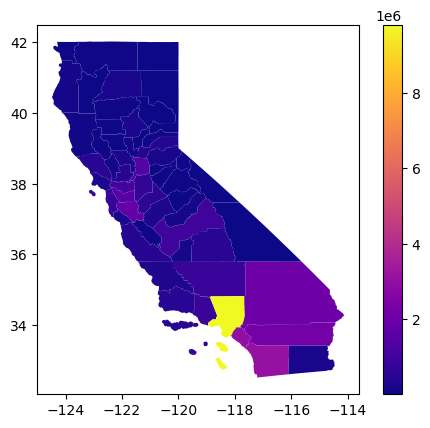

In [255]:
fig, ax = plt.subplots(1, 1)
ca_pop.plot(column='Population 2010', ax=ax, legend=True, cmap='plasma')

Orient the legend horizontally and label it

Turn off the axes

Change the ```cmap``` value to ```Blues```

See here for a list of colormap options
https://matplotlib.org/stable/tutorials/colors/colormaps.html

```fig, ax = plt.subplots(1, 1)
ca_pop.plot(column='Population 2010', ax=ax, legend=True, cmap='Blues',legend_kwds={'label': 'California Population by County 2010', 'orientation': "horizontal"})
ax.set_axis_off()```

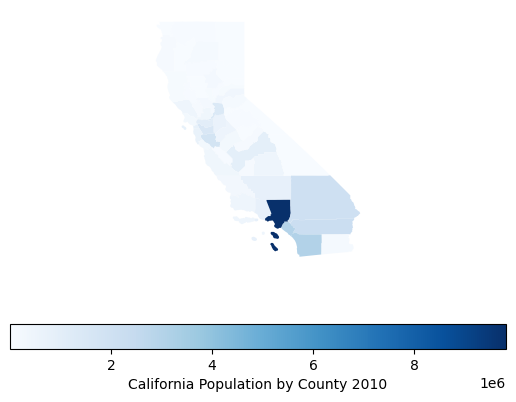

In [268]:
fig, ax = plt.subplots(1, 1)
ca_pop.plot(column='Population 2010', ax=ax, legend=True, cmap='Blues',legend_kwds={'label': 'California Population by County 2010', 'orientation': "horizontal"})
ax.set_axis_off()

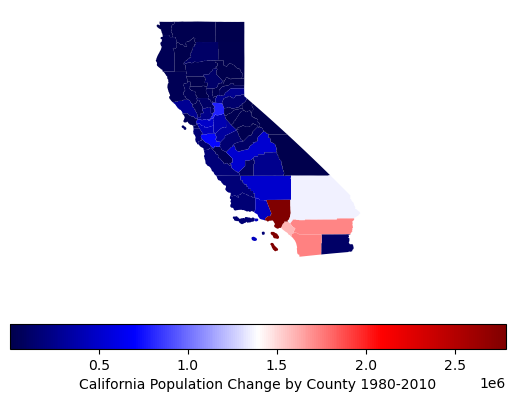

In [269]:
fig, ax = plt.subplots(1, 1)
ca_pop.plot(column='Change', ax=ax, legend=True, cmap='seismic',legend_kwds={'label': "California Population Change by County 1980-2010", 'orientation': "horizontal"})
ax.set_axis_off()